In [1]:
import pandas as pd

#Number of time frames and length of each time frame
length = 30425
step = 512/22050

# Initialise a list of time values and labels
steps = []
values = []

for i in range (length):
    steps.append(i * step)
    values.append(False)


# Create a DataFrame
df = pd.DataFrame({'time': steps, 'class': values})

In [2]:
#Read label data from csv
train = pd.read_csv('8janA_speech_timestamps.csv')

In [3]:
#Drop the unnecessary index column from csv
train.drop(columns=['Unnamed: 0'], inplace=True)

In [4]:
train.index.name = 'index'

In [5]:
train

,start,end
index,,
0,0.262041,0.873470
1,1.201021,3.395615
2,12.872765,16.399400
3,16.694196,19.478382
4,20.122566,23.943997
...,...,...
175,680.738870,686.088874
176,686.503772,691.504388
177,691.842858,693.240410


In [6]:
#Get the classes for each time segment from the given data
j = 0
flag = False
for i in range(length):
    
    while(i*step > train['end'][j]):
        j+=1
        if(j >= 180):
            flag = True
            break

    if(flag):
        break

    if(train['start'][j] <= i*step and i*step <= train['end'][j]):
        df['class'][i] = True
    

C:\Users\chinm\AppData\Local\Temp\ipykernel_25304\3042957205.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['class'][i] = True
C:\Users\chinm\AppData\Local\Temp\ipykernel_25304\3042957205.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['class'][i] = True
C:\Users\chinm\AppData\Local\Temp\ipykernel_25304\3042957205.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['class'][i] = True
C:\Users\chinm\AppData\Local\Te

In [7]:
df

,time,class
0,0.00000,False
1,0.02322,False
2,0.04644,False
3,0.06966,False
4,0.09288,False
...,...,...
30420,706.35102,True
30421,706.37424,True
30422,706.39746,True
30423,706.42068,True


In [8]:
#Convert class vector to required form with 0s and 1s
train_label = []

for i in df['class']:
    if i == False:
        train_label.append(0)
    else:
        train_label.append(1)

print(train_label)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [9]:
#Ckeck the no. of -ve and +ve values to check class imbalance
zero = 0
one = 0

for i in train_label:
    if i==0:
        zero+=1
    elif i==1:
        one+=1

print(zero, ", ", one)

#Find class imbalance
print(zero/(zero+one)*100, "% Negative Values")

3771 ,  26654
12.394412489728841 % Negative Values


In [10]:
import numpy as np
#Covert train_label to a numpy array
train_label = np.array(train_label)
train_label.shape

(30425,)

In [11]:
import librosa
import librosa.display
import IPython.display as ipd
import matplotlib.pyplot as plt

In [12]:
#Set and display input audio file
input = "8janA_bg.wav"
#ipd.Audio(input)

In [13]:
#Load audio
signal, sr = librosa.load(input)

#Calculate MFCCs, delta MFCCs and delta delta MFCCs and concatenate them to get feature vector
mfcc = librosa.feature.mfcc(y=signal, n_mfcc=13, sr=sr)
del_mfcc = librosa.feature.delta(mfcc)
del2_mfcc = librosa.feature.delta(mfcc, order=2)
mfcc_features = np.concatenate((mfcc, del_mfcc, del2_mfcc))

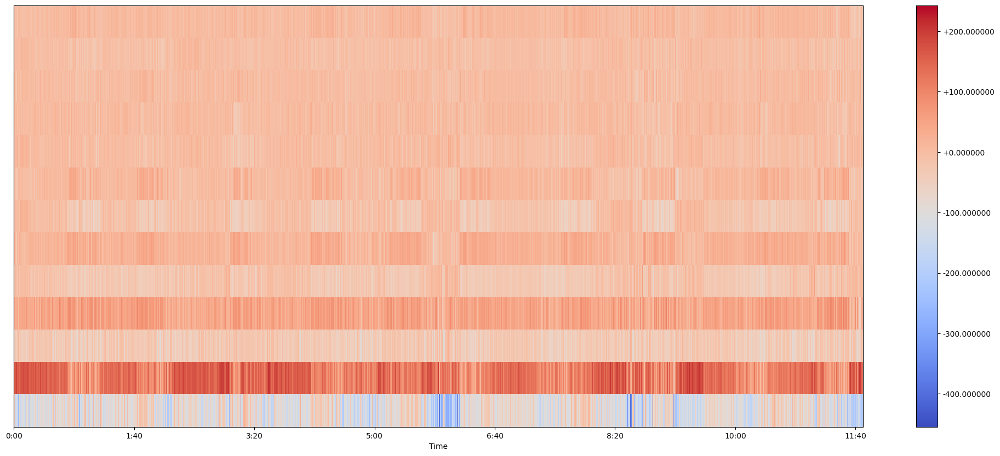

In [34]:
#Plot the mfccs
plt.figure(figsize=(25,10))
librosa.display.specshow(mfcc, x_axis="time",sr=sr)
plt.colorbar(format="%+2f")
plt.show()

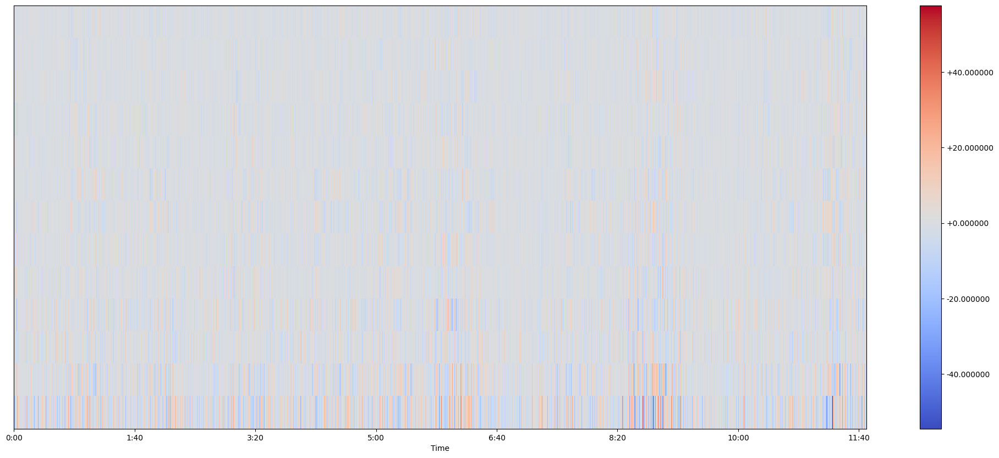

In [35]:
#Plot the del_mfcc
plt.figure(figsize=(25,10))
librosa.display.specshow(del_mfcc, x_axis="time",sr=sr)
plt.colorbar(format="%+2f")
plt.show()

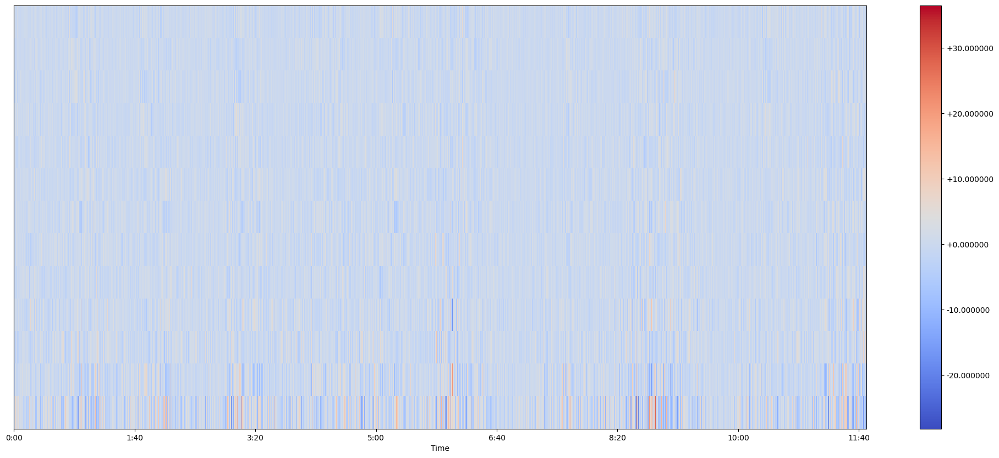

In [36]:
#Plot the del2_mfccs
plt.figure(figsize=(25,10))
librosa.display.specshow(del2_mfcc, x_axis="time",sr=sr)
plt.colorbar(format="%+2f")
plt.show()

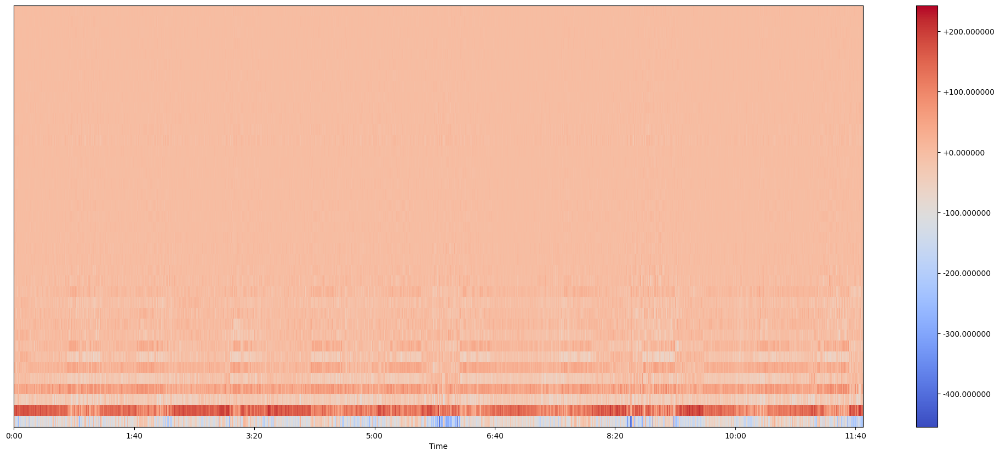

In [13]:
#Plot the mfcc_features
plt.figure(figsize=(25,10))
librosa.display.specshow(mfcc_features, x_axis="time",sr=sr)
plt.colorbar(format="%+2f")
plt.show()

In [14]:
mfcc_features = np.transpose(mfcc_features)

In [15]:
#Genrate train and test data
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(mfcc_features, train_label, test_size=0.2, random_state=42)

In [16]:
import tensorflow as tf
from tensorflow_addons.metrics import F1Score
from tensorflow.keras.callbacks import ModelCheckpoint

c:\Users\chinm\anaconda3\envs\tf\lib\site-packages\tensorflow_addons\utils\tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
c:\Users\chinm\anaconda3\envs\tf\lib\site-packages\tensorflow_addons\utils\ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.12.0 and strictly below 2.15.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.10.1 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want

In [17]:


#Define the model architecture
model = tf.keras.models.Sequential([
  tf.keras.layers.Dense(78, activation='relu', input_shape = (39,)),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(156, activation='relu'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(100, activation='relu'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(50, activation='relu'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(25, activation='relu'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(10, activation='relu'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(5, activation='relu'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(1, activation = 'sigmoid')
])

# Create an instance of the F1Score metric.
f1_score = F1Score(num_classes=2, average='micro')

#Compile model with Adam Optimization, Binary Cross Entropy loss function and accuracy & F1 score metrics
model.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics=['accuracy', f1_score])
#model.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics=['accuracy'])



In [29]:
#Train the model
model.fit(x_train, y_train, epochs=100, batch_size= 10000)

Epoch 1/100
3/3 [==============================] - 0s 8ms/step - loss: 0.0980 - accuracy: 0.9659 - f1_score: 0.9362
Epoch 2/100
3/3 [==============================] - 0s 6ms/step - loss: 0.0975 - accuracy: 0.9647 - f1_score: 0.9362
Epoch 3/100
3/3 [==============================] - 0s 8ms/step - loss: 0.0958 - accuracy: 0.9666 - f1_score: 0.9359
Epoch 4/100
3/3 [==============================] - 0s 11ms/step - loss: 0.0994 - accuracy: 0.9650 - f1_score: 0.9365
Epoch 5/100
3/3 [==============================] - 0s 8ms/step - loss: 0.1013 - accuracy: 0.9646 - f1_score: 0.9364
Epoch 6/100
3/3 [==============================] - 0s 8ms/step - loss: 0.0969 - accuracy: 0.9649 - f1_score: 0.9361
Epoch 7/100
3/3 [==============================] - 0s 9ms/step - loss: 0.0989 - accuracy: 0.9664 - f1_score: 0.9359
Epoch 8/100
3/3 [==============================] - 0s 9ms/step - loss: 0.0978 - accuracy: 0.9677 - f1_score: 0.9365
Epoch 9/100
3/3 [==============================] - 0s 9ms/step - loss: 

In [30]:
#Test the model with test data
model.evaluate(x_test,  y_test, verbose=2)

191/191 - 1s - loss: 0.1462 - accuracy: 0.9571 - f1_score: 0.9394 - 526ms/epoch - 3ms/step


[0.14623677730560303, 0.957107663154602, 0.9394311308860779]

In [56]:
#Save the Model
model.save('model1')

INFO:tensorflow:Assets written to: model1\assets


In [ ]:
model.save_weights('./checkpoints/weights')

In [ ]:
model.load_weights('./checkpoints/weights')

In [37]:
#Predict output on the given concatenated MFCCs features audio file
prediction = model.predict(mfcc_features)

951/951 [==============================] - 1s 1ms/step


In [42]:
#Supress and amplify predictions to 0 and 1
output = []

for value in prediction:
    if value < 0.5:
        output.append(0)
    else:
        output.append(1)

output = np.array(output)
print(output)

[0 0 0 ... 1 1 1]


In [44]:
output.shape

(30425,)

In [55]:
import csv
#Define threshhold below which speech segment is considered as noise and ignored 
noise_threshold = 0.1
#Define threshold of pause below which speech is considered as one single segment
pause_threshold = 0.1

#Generate segments of speech from the predictions for each small segment
previous_frame = 0
start_time = 0
stepLength = step

data = [["Start", "End"]]
idx = 0

for i in range(len(output)):

    current_time = i*stepLength
    current_frame = output[i]
    #If previous frame has speech
    if previous_frame == 1:
            
            #and current frame doesn't have speech
            # and falls outside noise threshold
            if current_frame == 0 and current_time-start_time >= noise_threshold:
                #print("Start Time: ", start_time, "End Time: ", current_time)
                data.append([idx, start_time, current_time])
                idx += 1
                
    #If previous frame doesn't have speech
    #and current frame does have speech
    #and falls outside pause threshold
    elif current_frame == 1:
            start_time = current_time
            if idx != 0 and start_time - float(data[-1][2]) < pause_threshold:
                 start_time = float(data[-1][1])
                 data.pop()
                 idx -= 1
    
    previous_frame = current_frame

#Get last speech segment if last frame also has speech
if previous_frame == 1:
     if len(output) * stepLength - start_time >= noise_threshold:
          data.append([start_time, current_time])

# Define the path to the CSV file
csv_file = 'prediction.csv'

# Open the CSV file in write mode
with open(csv_file, 'w', newline='') as file:
    writer = csv.writer(file)
    
    # Write the data to the CSV file row by row
    for row in data:
        writer.writerow(row)


In [84]:
#Test on new audio flle
test_audio = 'mic_M01_sa1.wav'
# Define the path to the CSV file
csv_file = 'prediction_test_mic.csv'
#Define threshhold below which speech segment is considered as noise and ignored 
noise_threshold = 0.05
#Define threshold of pause below which speech is considered as one single segment
pause_threshold = 0.25


#Load Model
model = tf.keras.models.load_model('model1')

#Load audio
signal_test, sr_test = librosa.load(test_audio)

#Calculate MFCCs, delta MFCCs and delta delta MFCCs and concatenate them to get feature vector
mfcc_test = librosa.feature.mfcc(y=signal_test, n_mfcc=13, sr=sr_test)
del_mfcc_test = librosa.feature.delta(mfcc_test)
del2_mfcc_test = librosa.feature.delta(mfcc_test, order=2)
mfcc_features_test = np.concatenate((mfcc_test, del_mfcc_test, del2_mfcc_test))
mfcc_features_test = np.transpose(mfcc_features_test)

#Predict output from features
prediction_test = model.predict(mfcc_features_test)

#Supress and amplify predictions to 0 and 1
prediction_test[prediction_test >= 0.5] = 1
prediction_test[prediction_test < 0.5] = 0
prediction_test.astype(int)


#Generate segments of speech from the predictions for each small segment
previous_frame = 0
start_time = 0
stepLength = step

data = [["", "Start", "End"]]
idx = 0

for i in range(len(prediction_test)):

    current_time = i*stepLength
    current_frame = prediction_test[i]
    #If previous frame has speech
    if previous_frame == 1:
            
            #and current frame doesn't have speech
            # and falls outside noise threshold
            if current_frame == 0 and current_time-start_time >= noise_threshold:
                #print("Start Time: ", start_time, "End Time: ", current_time)
                data.append([idx, start_time, current_time])
                idx += 1
                
    #If previous frame doesn't have speech
    #and current frame does have speech
    #and falls outside pause threshold
    elif current_frame == 1:
            start_time = current_time
            if idx != 0 and start_time - float(data[-1][2]) < pause_threshold:
                 start_time = float(data[-1][1])
                 data.pop()
                 idx -= 1
    
    previous_frame = current_frame

#Get last speech segment if last frame also has speech
if previous_frame == 1:
     if len(prediction_test) * stepLength - start_time >= noise_threshold:
          data.append([idx, start_time, current_time])


# Open the CSV file in write mode
with open(csv_file, 'w', newline='') as file:
    writer = csv.writer(file)
    
    # Write the data to the CSV file row by row
    for row in data:
        writer.writerow(row)

12/12 [==============================] - 0s 1ms/step


In [17]:
for batch_size in [5,25,125,625,3125,15625,30425]:

    #Define the model architecture
    model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(78, activation='relu', input_shape = (39,)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(156, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(100, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(50, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(25, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(10, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(5, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(1, activation = 'sigmoid')
    ])

    # Create an instance of the F1Score metric.
    f1_score = F1Score(num_classes=2, average='micro')

    #Compile model with Adam Optimization, Binary Cross Entropy loss function and accuracy & F1 score metrics
    model.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics=['accuracy', f1_score])
    #model.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics=['accuracy'])

    filepath="./batch_size-" + str(batch_size) + "/wght-imprv-{epoch:02d}-{accuracy:.2f}-{f1_score:.2f}.hdf5"
    checkpoint = ModelCheckpoint(filepath, monitor='accuracy', verbose=1, save_best_only=True, mode='max')
    callbacks_list = [checkpoint]

    model.fit(x_train, y_train, epochs=100, batch_size=batch_size, callbacks=callbacks_list)
    model.save_weights("./batch_size-" + str(batch_size) + "/100.hdf5") 



Epoch 1/100
4866/4868 [============================>.] - ETA: 0s - loss: 0.3797 - accuracy: 0.8710 - f1_score: 0.9334
Epoch 1: accuracy improved from -inf to 0.87104, saving model to ./batch_size-5\wght-imprv-01-0.87-0.93.hdf5
4868/4868 [==============================] - 24s 5ms/step - loss: 0.3797 - accuracy: 0.8710 - f1_score: 0.9334
Epoch 2/100
4860/4868 [============================>.] - ETA: 0s - loss: 0.2730 - accuracy: 0.9032 - f1_score: 0.9335
Epoch 2: accuracy improved from 0.87104 to 0.90329, saving model to ./batch_size-5\wght-imprv-02-0.90-0.93.hdf5
4868/4868 [==============================] - 23s 5ms/step - loss: 0.2727 - accuracy: 0.9033 - f1_score: 0.9335
Epoch 3/100
4866/4868 [============================>.] - ETA: 0s - loss: 0.2506 - accuracy: 0.9127 - f1_score: 0.9336
Epoch 3: accuracy improved from 0.90329 to 0.91270, saving model to ./batch_size-5\wght-imprv-03-0.91-0.93.hdf5
4868/4868 [==============================] - 21s 4ms/step - loss: 0.2506 - accuracy: 0.9127

In [22]:
model.load_weights("batch_size-25/100.hdf5")
filepath="./25-batch_size-2" + "/wght-imprv-{epoch:02d}-{accuracy:.2f}-{f1_score:.2f}.hdf5"
checkpoint = ModelCheckpoint(filepath, monitor='accuracy', verbose=1, save_best_only=True, mode='max')
callbacks_list = [checkpoint]

model.fit(x_train, y_train, epochs=4000, batch_size=25, callbacks=callbacks_list)
model.save_weights("./25-batch_size-2/5000.hdf5") 


Epoch 1/4000
973/974 [============================>.] - ETA: 0s - loss: 0.1225 - accuracy: 0.9540 - f1_score: 0.9398
Epoch 1: accuracy improved from -inf to 0.95403, saving model to ./25-batch_size-2\wght-imprv-01-0.95-0.94.hdf5
974/974 [==============================] - 7s 7ms/step - loss: 0.1225 - accuracy: 0.9540 - f1_score: 0.9398
Epoch 2/4000
969/974 [============================>.] - ETA: 0s - loss: 0.1168 - accuracy: 0.9545 - f1_score: 0.9393
Epoch 2: accuracy improved from 0.95403 to 0.95456, saving model to ./25-batch_size-2\wght-imprv-02-0.95-0.94.hdf5
974/974 [==============================] - 6s 6ms/step - loss: 0.1167 - accuracy: 0.9546 - f1_score: 0.9393
Epoch 3/4000
967/974 [============================>.] - ETA: 0s - loss: 0.1157 - accuracy: 0.9548 - f1_score: 0.9391
Epoch 3: accuracy improved from 0.95456 to 0.95477, saving model to ./25-batch_size-2\wght-imprv-03-0.95-0.94.hdf5
974/974 [==============================] - 5s 6ms/step - loss: 0.1159 - accuracy: 0.9548 - 

In [20]:
model.save_weights("./25-batch_size/1000.hdf5") 

In [21]:
model.evaluate(x_test,  y_test, verbose=2)

191/191 - 1s - loss: 0.3370 - accuracy: 0.9635 - f1_score: 0.9460 - 674ms/epoch - 4ms/step


[0.33698680996894836, 0.9635168313980103, 0.946000874042511]